# Real Estate Prediction

## EDA


First of all, we import pandas and load the csv.

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns 
import matplotlib.pyplot as plt
import plotly.express as px

In [2]:
df = pd.read_csv("data/real_estate_ads_2022_10.csv")
df.head()

,id,market,created_at_first,updated_at,district_lon,district_lat,title,description,params,price,no_rooms,m,price_per_m,map_lon,map_lat
0,58668640,secondary,2019-04-09 16:12:54.000,2019-04-15 18:54:38.000,16.90502,52.41180,Mieszkanie z potencjałem. Rynek Jeżycki.,<p>Zapraszam do zakupu mieszkania zlokalizowan...,price<=>price<br>price<=>260000<br>price[curre...,260000.0,2,51.0,5098.04,16.896592,52.410150
1,58887800,secondary,2019-04-25 17:20:01.000,2019-05-27 11:36:14.000,16.87466,52.41572,Okazja Jeżyce!!!!!,<p>Polecam na sprzedaż mieszkanie kawalerka o ...,price<=>price<br>price<=>155000<br>price[curre...,155000.0,1,26.0,5961.54,16.904410,52.411919
2,55129916,secondary,2018-08-02 16:40:35.000,2021-11-28 01:56:53.000,16.90502,52.41180,"**Okazja * 60,1m2 * 3 pokoje * poddasze * Jeży...",<p> **Przestronne mieszkanie 3 pokojowe * na ...,price<=>price<br>price<=>280000<br>price[curre...,280000.0,3,60.1,4658.90,16.899310,52.413357
3,60011531,secondary,2019-12-05 12:45:49.000,2020-01-15 16:05:42.000,16.87466,52.41572,"Mieszkanie 2-pokojowe, Ogrody, Kampus Uam",<p>Serdecznie zapraszam do zapoznania się z of...,price<=>price<br>price<=>339000<br>price[curre...,339000.0,2,47.0,7212.77,16.883608,52.410662
4,60096194,secondary,2020-01-10 14:53:19.000,2020-02-13 15:25:07.000,16.87466,52.41572,Jeżyce 2 pokoje,<p>Polecam na sprzedaż mieszkanie z komórka lo...,price<=>price<br>price<=>325000<br>price[curre...,325000.0,2,44.0,7386.36,16.890796,52.412308


The dataframe with information of the different real estate ads. Each row contains the the data of an ad.

There are some columns for the metadata like _id_, _market_ and the creation and modificaton dates. The rest is data that we could use for our task, specially the data compressed in _params_ that we need to extract  in different columns.

But before we even start with that, we filter out all the entries from the primary _market_ since we are only interested in the secondary one. This will save us calculation time.

In [3]:
print(f"Total number of rows:          {df.shape[0]}")

df = df[df.market == 'secondary']

print(f"Rows for the secondary market: {df.shape[0]}")

df.nunique()

Total number of rows:          73645
Rows for the secondary market: 43313


id                  43313
market                  1
created_at_first    43264
updated_at          36622
district_lon           82
district_lat           83
title               30439
description         37361
params              39075
price                3574
no_rooms               11
m                    4170
price_per_m         18510
map_lon             11233
map_lat             11278
dtype: int64

We see that, as expected, _id_ is a primary key so we can remove the column along with market, because they are not helping us in the prediction. 

Also it is interesting to see that there are many duplicates in _title_, _description_ and _params_. We will takle this later but we can start by droping duplicates in this subset.

In [4]:
print(f"Number of rows with duplicates:    {df.shape[0]}")

df = df.drop(["id", "market"], axis = 1)
df.drop_duplicates(["description", "title", "params"], inplace= True)


print(f"Number of rows without duplicates: {df.shape[0]}")
df.nunique()

Number of rows with duplicates:    43313
Number of rows without duplicates: 40856


created_at_first    40814
updated_at          34991
district_lon           82
district_lat           83
title               30439
description         37361
params              39075
price                3574
no_rooms               11
m                    4170
price_per_m         18504
map_lon             11219
map_lat             11265
dtype: int64

Ok. Since we have the coordinates lets plot the square meter price on a map.

In [5]:
def map_scatter_plot(column, scale):  
    # Plotting the map with Plotly
    fig = px.scatter_mapbox(
        df, 
        lat="map_lat", 
        lon="map_lon",
        color= column,
        color_continuous_scale = scale,
        zoom=10, 
        height=600
    )

    # Update the layout to include Mapbox token
    fig.update_layout(mapbox_style="open-street-map")

    # Show the plot
    fig.show()


map_scatter_plot("price_per_m", "thermal")

<Axes: >

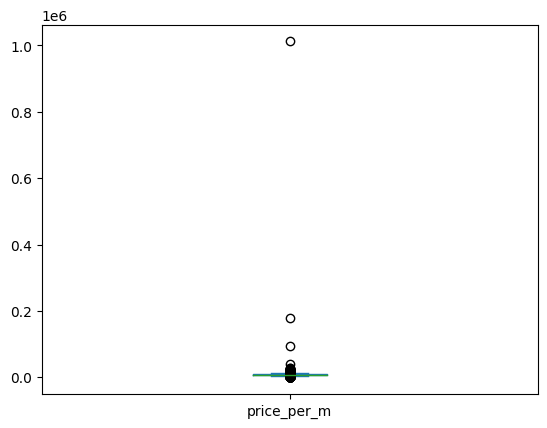

In [6]:
df.price_per_m.plot(kind = "box")

Allright, the dataset contains real estate ads from the city of Poznan in Poland

But we can't really see any difference in the prices because of the outliers. Let's remove some observations from both extremes.

<Axes: >

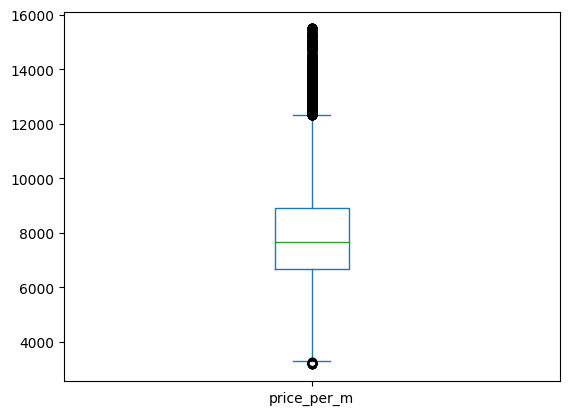

In [7]:
lower_bound = df['price_per_m'].quantile(0.005)
upper_bound = df['price_per_m'].quantile(0.995)

df = df[(df['price_per_m'] >= lower_bound) & (df['price_per_m'] <= upper_bound)]

df.price_per_m.plot(kind = "box")

In [8]:
map_scatter_plot("price_per_m", "thermal")

Now it is much better. Now we can see that there are a geospatial correlation, as we expected, because there are some neighborhoods more demanded than others.

Whit this in mind, let's use the _district_lon_ and _district_lat_ to make a new column for this category. Then we will remove the rows containing missing values for those columns and after that we will plot all the observations by districts on a map. 

In [9]:
df["district"] = "(" + df["district_lon"].astype("string") + ", " + df["district_lat"].astype("string") + ")"

df = df[~df.district_lon.isna()]
df = df[~df.district_lat.isna()]

districts = list(df["district"].unique())
districts_names = {}

for i, district in enumerate(districts):
    districts_names[district] = f"district_{i}"

df["district"].replace(districts_names, inplace= True)

# Plotting the map with Plotly
fig = px.scatter_mapbox(
    df, 
    lat="map_lat", 
    lon="map_lon",
    color="district",
    color_discrete_sequence=px.colors.qualitative.Alphabet,
    zoom=10, 
    height=600
)

# Update the layout to include Mapbox token
fig.update_layout(mapbox_style="open-street-map")

# Show the plot
fig.show()

We see that there are 83 districts that are not clearly separetad and many of them have very few observations.

This of course not ideal and might be good to have some knowledge of the city to understand this issue. 

Since we do not, we will do the best to adress it.

Number of districts: 83
Number of count:
[41, 216, 327, 47, 297, 2581, 1, 527, 128, 13, 3, 51, 79, 1683, 294, 141, 122, 121, 41, 2448, 1229, 30, 22, 32, 63, 65, 5, 91, 57, 42, 110, 1, 3, 5, 16, 1, 12, 302, 143, 999, 4435, 3143, 2505, 174, 26, 3, 2923, 616, 717, 214, 5, 2, 4978, 93, 2, 44, 1, 50, 6, 4, 22, 126, 50, 37, 88, 4, 289, 6, 964, 86, 28, 4, 3, 1, 1, 1, 1, 0, 325, 1, 1, 1, 1305]


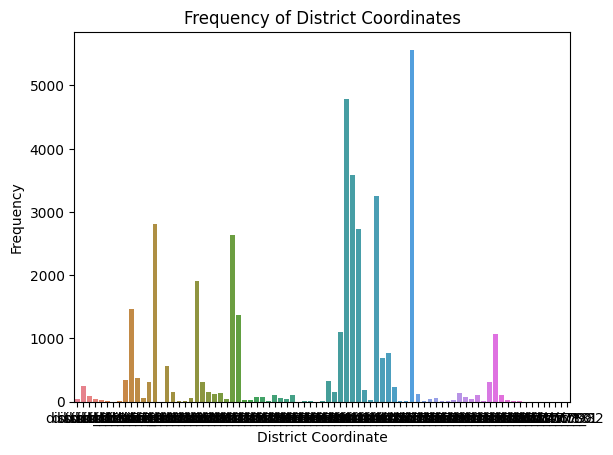

In [10]:
print(f"Number of districts: {df.district.nunique()}")
print(f"Number of count:")
print(df.groupby("district").count()["title"].to_list())

# Plot a bar chart using Seaborn
sns.countplot(x='district', data=df, hue = "district")

# Add labels and title
plt.xlabel('District Coordinate')
plt.ylabel('Frequency')
plt.title('Frequency of District Coordinates')

# Show the plot
plt.show()

In [11]:
print(df.district.nunique())
print(df.groupby("district").count()["title"].to_list())

df = df[(df["district_lat"] > 52) &
        (df["district_lat"] < 52.6) &
        (df["district_lon"] > 16.7) &
        (df["district_lon"] < 17.2)]

districts_dict = df.groupby("district").count()["title"].to_dict()
districts_reduced = {}

for district, number in districts_dict.items():
    if number < 20:
        districts_reduced[district] = "rest"
    else:
        districts_reduced[district] = district

df["district"] = df["district"].map(districts_reduced).copy()

print(df.district.nunique())
print(df.groupby("district").count()["title"].to_list())


83
[41, 216, 327, 47, 297, 2581, 1, 527, 128, 13, 3, 51, 79, 1683, 294, 141, 122, 121, 41, 2448, 1229, 30, 22, 32, 63, 65, 5, 91, 57, 42, 110, 1, 3, 5, 16, 1, 12, 302, 143, 999, 4435, 3143, 2505, 174, 26, 3, 2923, 616, 717, 214, 5, 2, 4978, 93, 2, 44, 1, 50, 6, 4, 22, 126, 50, 37, 88, 4, 289, 6, 964, 86, 28, 4, 3, 1, 1, 1, 1, 0, 325, 1, 1, 1, 1305]
55
[41, 216, 327, 47, 297, 2581, 527, 128, 51, 79, 1683, 294, 141, 122, 121, 41, 2448, 1229, 30, 22, 32, 63, 65, 91, 57, 42, 110, 302, 143, 999, 4435, 3143, 2505, 174, 26, 2923, 616, 717, 214, 4978, 93, 44, 50, 22, 126, 50, 37, 88, 289, 964, 86, 28, 325, 1305, 105]


In [12]:
df.drop(["district_lon", "district_lat", "map_lon", "map_lat"], axis= 1, inplace = True)

df.describe(include="all")

,created_at_first,updated_at,title,description,params,price,no_rooms,m,price_per_m,district
count,39332,39332,35672,39332,39332,3.933200e+04,39332,39332.000000,39332.000000,39332
unique,39294,33741,29415,36041,37640,NaN,11,NaN,NaN,55
top,2019-04-25 17:16:16.000,2018-11-09 17:12:38.000,Rezerwacja,<p>Polecam do sprzedaży mieszkanie w standardz...,price<=>price<br>price<=>750000<br>price[curre...,NaN,2,NaN,NaN,district_56
freq,2,11,72,44,11,NaN,17604,NaN,NaN,5568
mean,NaN,NaN,NaN,NaN,NaN,4.164071e+05,NaN,53.932823,7919.566598,NaN
std,NaN,NaN,NaN,NaN,NaN,1.859037e+05,NaN,23.094191,1793.552111,NaN
min,NaN,NaN,NaN,NaN,NaN,6.900000e+04,NaN,11.000000,3180.000000,NaN
25%,NaN,NaN,NaN,NaN,NaN,3.110000e+05,NaN,39.000000,6666.670000,NaN
50%,NaN,NaN,NaN,NaN,NaN,3.790000e+05,NaN,49.000000,7686.060000,NaN
75%,NaN,NaN,NaN,NaN,NaN,4.679250e+05,NaN,63.000000,8928.570000,NaN


Now let's review the creation and update dates.

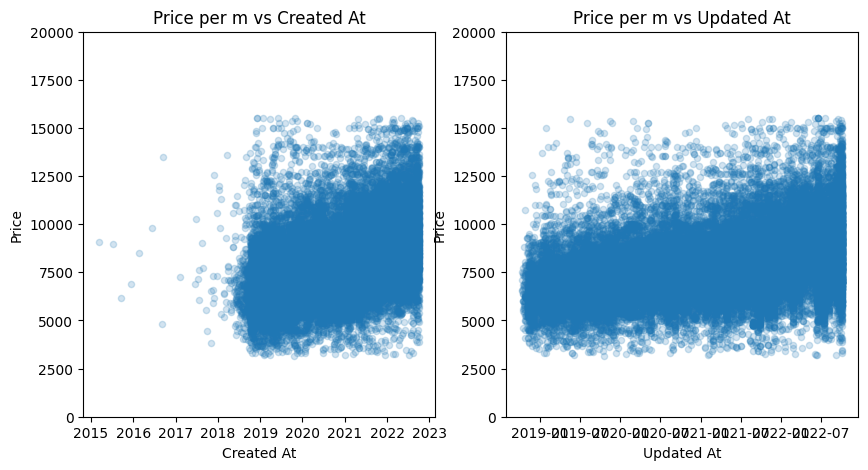

,created_at_first,updated_at
created_at_first,1.000000,0.809405
updated_at,0.809405,1.000000


In [13]:
df["created_at_first"] = pd.to_datetime(df["created_at_first"])
df["updated_at"] = pd.to_datetime(df["updated_at"])

fig, axs = plt.subplots(1,2, figsize = (10,5))

df.plot(kind = "scatter", x= "created_at_first", y =  "price_per_m", alpha= 0.2, ax= axs[0])

axs[0].set_title('Price per m vs Created At')
axs[0].set_ylim([0, 20000])
axs[0].set_xlabel('Created At')
axs[0].set_ylabel('Price')

df.plot(kind = "scatter", x= "updated_at", y =  "price_per_m", alpha= 0.2, ax= axs[1])

axs[1].set_title('Price per m vs Updated At')
axs[1].set_ylim([0, 20000])
axs[1].set_xlabel('Updated At')
axs[1].set_ylabel('Price')

plt.show()

df[["created_at_first", "updated_at"]].corr()

We see a positive trend in both of them, so it might be useful to inlcude this information in our model.

Since both of them are highly correlated, we will keep the information of the update date. 

We create a new column _updated_year_ and drop _created_at_first_ and _updated_at_

In [14]:
df["updated_at_year"] = df["updated_at"].dt.year
df.drop(["created_at_first", "updated_at"], inplace= True, axis = 1)

Now let's extract the information in params.

In [15]:
df["params"][23]

'price<=>price<br>price<=>349000<br>price[currency]<=>PLN<br>m<=>64<br>rooms_num<=>3<br>market<=>secondary<br>building_type<=>block<br>floor_no<=>floor_8<br>building_floors_num<=>10<br>building_material<=>concrete_plate<br>windows_type<=>plastic<br>heating<=>urban<br>build_year<=>1977<br>construction_status<=>to_renovation<br>rent<=>price<br>rent<=>600<br>rent[currency]<=>PLN<br>building_ownership<=>co_operative_ownership<br>free_from<=><br>media_types<=>cable-television<->internet<br>security_types<=><br>equipment_types<=><br>extras_types<=>basement<->lift<br>price_per_m<=>5453.13'

The string contained appears to be a structured data format, where key-value pairs are separated by <=> and multiple entries within certain keys are separated by <->. 
 
Let's parse it into a pandas dataframe:

In [16]:
def params_parser(pairs):
    # Initialize an empty dictionary to store the parsed data
    parsed_data = {}

    # Process each pair
    for pair in pairs:
        if "<=>" in pair:
            key, value = pair.split("<=>", 1)
            if "<->" in value:
                value = value.split("<->")
            parsed_data[key] = value

    # Output the parsed data
    return(parsed_data)

pairs =df["params"].str.split("<br>").apply(params_parser)
df.drop("params", axis = 1, inplace = True)
df_params = pd.json_normalize(pairs)
df_params.head()

,price,price[currency],m,rooms_num,market,building_type,floor_no,building_floors_num,building_material,windows_type,...,garret_type,roof_type,roofing,location,recreational,fence_types,heating_types,access_types,vicinity_types,is_bungalow
0,260000,PLN,51,2,secondary,tenement,floor_3,3,brick,plastic,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,155000,PLN,26,1,secondary,,floor_4,4,,,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,280000,PLN,60.1,3,secondary,tenement,floor_4,4,brick,wooden,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,339000,PLN,47,2,secondary,block,floor_1,4,brick,,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,325000,PLN,44,2,secondary,,floor_3,4,,,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Alright, so we have a lot new columns. At first sight we spot some NaNs and "". 

Let's drop the columns with high number of NaNs. 

After that we can change the "" to NaNs 

In [17]:
print("Columns: ")
print(df_params.columns)

Columns: 
Index(['price', 'price[currency]', 'm', 'rooms_num', 'market', 'building_type',
       'floor_no', 'building_floors_num', 'building_material', 'windows_type',
       'heating', 'build_year', 'construction_status', 'rent',
       'rent[currency]', 'building_ownership', 'free_from', 'media_types',
       'security_types', 'equipment_types', 'extras_types', 'price_per_m',
       'remote_services', 'terrain_area', 'floors_num', 'garret_type',
       'roof_type', 'roofing', 'location', 'recreational', 'fence_types',
       'heating_types', 'access_types', 'vicinity_types', 'is_bungalow'],
      dtype='object')


In [18]:
nan_percentage = df_params.isna().mean()
df_params = df_params.loc[:, nan_percentage <= 0.5]

In [19]:
df_params.replace("",np.nan, inplace= True)

In [20]:
df_params.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39332 entries, 0 to 39331
Data columns (total 23 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   price                39332 non-null  object
 1   price[currency]      39332 non-null  object
 2   m                    39332 non-null  object
 3   rooms_num            39332 non-null  object
 4   market               39332 non-null  object
 5   building_type        31386 non-null  object
 6   floor_no             38719 non-null  object
 7   building_floors_num  37054 non-null  object
 8   building_material    20928 non-null  object
 9   windows_type         24459 non-null  object
 10  heating              28045 non-null  object
 11  build_year           25321 non-null  object
 12  construction_status  24232 non-null  object
 13  rent                 21739 non-null  object
 14  rent[currency]       35540 non-null  object
 15  building_ownership   28312 non-null  object
 16  free

We have reduce the columns from 35 to 22. Lets see more details

In [21]:
df_params.iloc[:,:10].describe()

,price,price[currency],m,rooms_num,market,building_type,floor_no,building_floors_num,building_material,windows_type
count,39332,39332,39332,39332,39332,31386,38719,37054,20928,24459
unique,3346,2,4043,11,1,9,14,26,10,3
top,399000,PLN,38,2,secondary,block,floor_1,4,brick,plastic
freq,827,39330,1490,17604,39332,20937,6905,16132,13595,21640


In [22]:
df_params.iloc[:,10:].describe()

,heating,build_year,construction_status,rent,rent[currency],building_ownership,free_from,media_types,security_types,equipment_types,extras_types,price_per_m,remote_services
count,28045,25321,24232,21739,35540,28312,5372,21072,19206,17159,32720,39332,3342
unique,6,186,3,1051,3,4,1277,14,58,103,447,17594,1
top,urban,1980,ready_to_use,500,PLN,full_ownership,2022-12-31,"[cable-television, internet, phone]",entryphone,0,lift,7500,1
freq,22233,1641,19083,1489,35538,20154,63,7616,7067,4296,2481,207,3342


Now we will join the df_params with the original df, for that we have to drop duplicate columns and a then _rent_ columns because, they are not a house property and may introduce data leakage.

In [23]:
# Dropping some more columns

df_params.drop(["m", 
                "rooms_num", 
                "market", 
                "price_per_m",
                "price"
                ], axis = 1 , inplace= True)  # these are already in df_filtered

df_params.drop(["rent",                 
                "rent[currency]",       
                "free_from"             
                ], axis = 1 , inplace= True)  # not relevant

# Reset indexes and JOIN

df.reset_index(drop=True, inplace=True)
df_params.reset_index(drop=True, inplace=True)

df_complete = pd.concat([df.copy(), df_params.copy()], axis = 1)

# Considering only PLN currency

df_complete = df_complete[df_complete["price[currency]"] == "PLN"]
df_complete.drop(["price[currency]","price"], axis = 1, inplace = True)

df_complete.head()


,title,description,no_rooms,m,price_per_m,district,updated_at_year,building_type,floor_no,building_floors_num,...,windows_type,heating,build_year,construction_status,building_ownership,media_types,security_types,equipment_types,extras_types,remote_services
0,Mieszkanie z potencjałem. Rynek Jeżycki.,<p>Zapraszam do zakupu mieszkania zlokalizowan...,2,51.0,5098.04,district_0,2019,tenement,floor_3,3,...,plastic,NaN,1920,to_renovation,full_ownership,"[cable-television, internet, phone]",NaN,NaN,basement,NaN
1,Okazja Jeżyce!!!!!,<p>Polecam na sprzedaż mieszkanie kawalerka o ...,1,26.0,5961.54,district_1,2019,NaN,floor_4,4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,"**Okazja * 60,1m2 * 3 pokoje * poddasze * Jeży...",<p> **Przestronne mieszkanie 3 pokojowe * na ...,3,60.1,4658.90,district_0,2021,tenement,floor_4,4,...,wooden,electrical,1980,ready_to_use,full_ownership,"[cable-television, internet, phone]",NaN,NaN,NaN,NaN
3,"Mieszkanie 2-pokojowe, Ogrody, Kampus Uam",<p>Serdecznie zapraszam do zapoznania się z of...,2,47.0,7212.77,district_1,2020,block,floor_1,4,...,NaN,urban,1965,ready_to_use,full_ownership,NaN,NaN,NaN,"[basement, separate_kitchen, usable_room]",NaN
4,Jeżyce 2 pokoje,<p>Polecam na sprzedaż mieszkanie z komórka lo...,2,44.0,7386.36,district_1,2020,NaN,floor_3,4,...,NaN,NaN,1936,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [24]:
df_complete.info()

<class 'pandas.core.frame.DataFrame'>
Index: 39330 entries, 0 to 39331
Data columns (total 21 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   title                35670 non-null  object 
 1   description          39330 non-null  object 
 2   no_rooms             39330 non-null  object 
 3   m                    39330 non-null  float64
 4   price_per_m          39330 non-null  float64
 5   district             39330 non-null  object 
 6   updated_at_year      39330 non-null  int32  
 7   building_type        31386 non-null  object 
 8   floor_no             38717 non-null  object 
 9   building_floors_num  37053 non-null  object 
 10  building_material    20928 non-null  object 
 11  windows_type         24459 non-null  object 
 12  heating              28044 non-null  object 
 13  build_year           25320 non-null  object 
 14  construction_status  24231 non-null  object 
 15  building_ownership   28311 non-null  obje

Now let's consolidate the dataset.

There are some categorical columns that might be convert numerical using ordinal encoding almost directly:
- "build_year"
- "building_floors_num"
- "floor_no"
- "no_rooms"

In [25]:
columns_to_convert = ["build_year",
                      "building_floors_num", 
                      "floor_no", 
                      "no_rooms"]

for column in columns_to_convert:
    print(column + ":")
    print(df_complete[column].unique())

build_year:
['1920' nan '1980' '1965' '1936' '1840' '2018' '1955' '1957' '2002' '1959'
 '1977' '1960' '2011' '2016' '1958' '2015' '1956' '2009' '2019' '1950'
 '1990' '2007' '2001' '1995' '1910' '2012' '2017' '1970' '1938' '1992'
 '2014' '1963' '2010' '2008' '1998' '2020' '2013' '2004' '2005' '1993'
 '1994' '1996' '2000' '2003' '1997' '2006' '1988' '1989' '2021' '1975'
 '2022' '1987' '1999' '1986' '1978' '1985' '1991' '1976' '1984' '1982'
 '1981' '1979' '1941' '1967' '1968' '1935' '1905' '1900' '1906' '1908'
 '1903' '1971' '1964' '1947' '1907' '1901' '1939' '1969' '1930' '1966'
 '1937' '1940' '1918' '1945' '15' '1974' '1934' '1915' '1983' '1925'
 '1919' '1912' '1911' '1948' '1904' '1933' '1962' '1942' '1973' '1972'
 '1913' '1946' '1961' '1949' '1926' '1895' '1914' '1902' '1929' '1923'
 '1890' '1932' '1873' '1888' '2023' '1870' '1894' '1928' '1860' '1953'
 '1880' '1876' '1896' '1850' '1887' '1897' '1899' '1954' '50' '1952'
 '1590' '1872' '1943' '1909' '197' '1944' '1838' '2024' '1921' '1

In [26]:
columns_to_convert = ["build_year", "building_floors_num", "floor_no", "no_rooms"]

df_complete.dropna(subset = columns_to_convert, inplace = True)

df_complete["no_rooms"].replace({"more": '11'}, inplace= True)
df_complete["floor_no"].replace({"floor_higher_10": 'floor_11',
                                 "cellar" : "floor_-1",
                                 "ground_floor": "floor_0",
                                 'garret': '_garret'
                                 }, inplace= True)

df_complete["floor_no"] = df_complete["floor_no"].str.split("_",expand = True)[1]

df_complete.loc[df_complete["floor_no"] == "garret", "floor_no"] = df_complete.loc[df_complete["floor_no"] == "garret", "building_floors_num"]

df_complete[columns_to_convert] = df_complete[columns_to_convert].astype("int32")

df_complete = df_complete[(df_complete["build_year"] > 1800 ) &
                          (df_complete["build_year"] < 2025 )
                        ]

df_complete["remote_services"].fillna(0, inplace = True)
df_complete["remote_services"] = df_complete["remote_services"].astype("int8")

df_complete.info()

<class 'pandas.core.frame.DataFrame'>
Index: 24401 entries, 0 to 39331
Data columns (total 21 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   title                22076 non-null  object 
 1   description          24401 non-null  object 
 2   no_rooms             24401 non-null  int32  
 3   m                    24401 non-null  float64
 4   price_per_m          24401 non-null  float64
 5   district             24401 non-null  object 
 6   updated_at_year      24401 non-null  int32  
 7   building_type        20308 non-null  object 
 8   floor_no             24401 non-null  int32  
 9   building_floors_num  24401 non-null  int32  
 10  building_material    15057 non-null  object 
 11  windows_type         15289 non-null  object 
 12  heating              18832 non-null  object 
 13  build_year           24401 non-null  int32  
 14  construction_status  16265 non-null  object 
 15  building_ownership   18949 non-null  obje

So now we have defined our numerical variables. Lets plot them.

array([[<Axes: title={'center': 'no_rooms'}>,
        <Axes: title={'center': 'm'}>,
        <Axes: title={'center': 'price_per_m'}>],
       [<Axes: title={'center': 'updated_at_year'}>,
        <Axes: title={'center': 'floor_no'}>,
        <Axes: title={'center': 'building_floors_num'}>],
       [<Axes: title={'center': 'build_year'}>, <Axes: >, <Axes: >]],
      dtype=object)

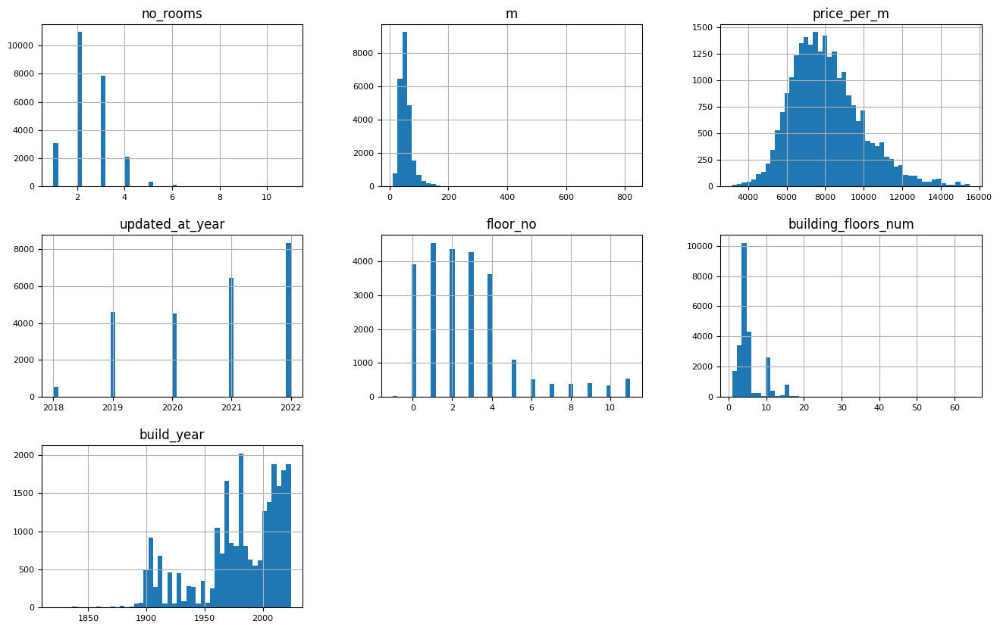

In [27]:
cat_variables = df_complete.select_dtypes(include=['object']).columns.to_list()
num_variables = df_complete.select_dtypes(include=['int', 'float']).columns.to_list()

df_complete[num_variables].hist(figsize=(16, 10), bins=50, xlabelsize=8, ylabelsize=8)

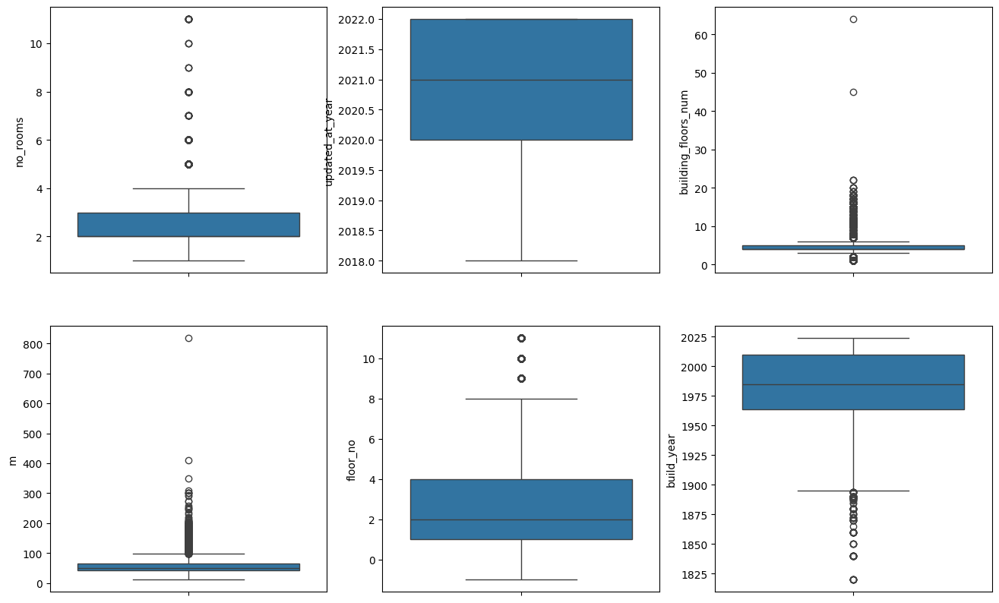

In [28]:
plot_variables = ['no_rooms',
                'm',
                'updated_at_year',
                'floor_no',
                'building_floors_num',
                'build_year']

fig, axs = plt.subplots(2, 3, figsize = (16,10))

for i, variable in enumerate(plot_variables):

    sns.boxplot(df_complete[variable], ax = axs[i%2][i//2])

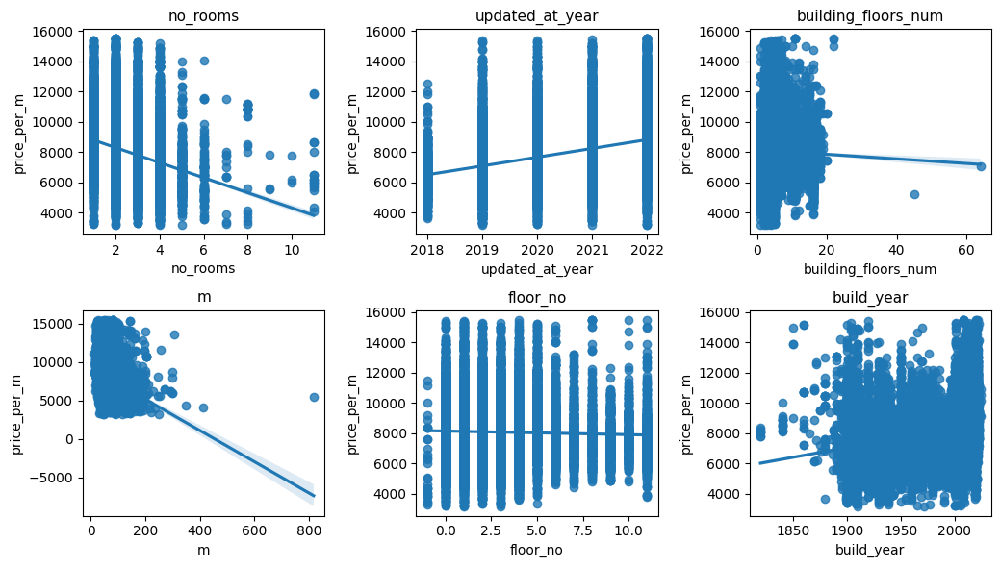

In [29]:
nr_rows = 2
nr_cols = 3

fig, axs = plt.subplots(nr_rows, nr_cols, figsize=(nr_cols*3.5,nr_rows*3))

for i , variable in enumerate(plot_variables):
    sns.regplot(x = df_complete[plot_variables[i]], y = df_complete["price_per_m"], ax = axs[i%2][i//2])
    axs[i%2][i//2].set_title(variable,fontsize=11)
            
plt.tight_layout()    
plt.show()  

We can see a couple of outliers in _bluiding_floors_num_ and _m_. Let's filter them.

In [30]:
df_complete = df_complete[df_complete["m"] < 400]
df_complete = df_complete[df_complete["building_floors_num"] < 20]

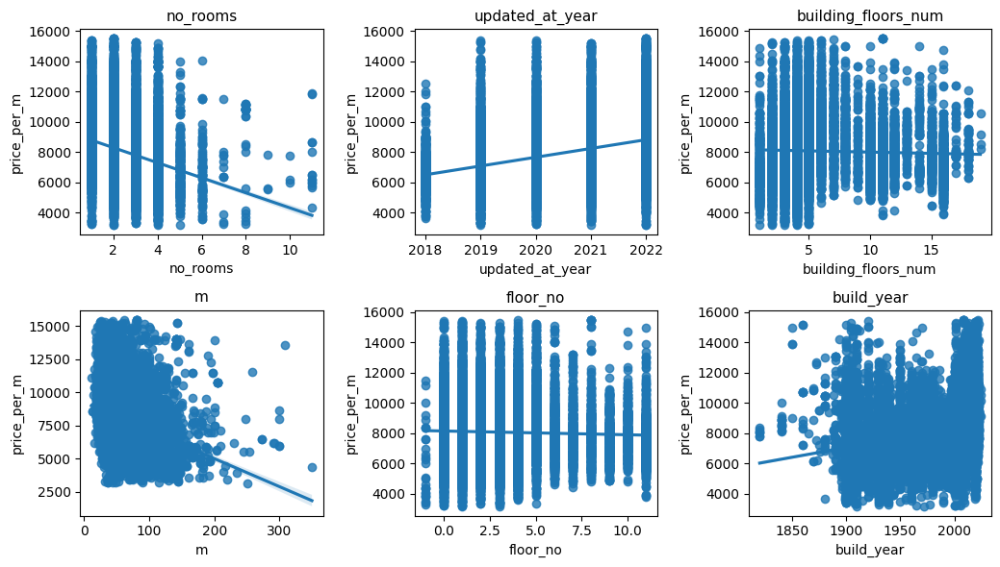

In [31]:
nr_rows = 2
nr_cols = 3

fig, axs = plt.subplots(nr_rows, nr_cols, figsize=(nr_cols*3.5,nr_rows*3))

for i , variable in enumerate(plot_variables):
    sns.regplot(x = df_complete[plot_variables[i]], y = df_complete["price_per_m"], ax = axs[i%2][i//2])
    axs[i%2][i//2].set_title(variable,fontsize=11)
            
plt.tight_layout()    
plt.show()  

Now it is much better. Finally lets check the correlations between the variables.

<Axes: >

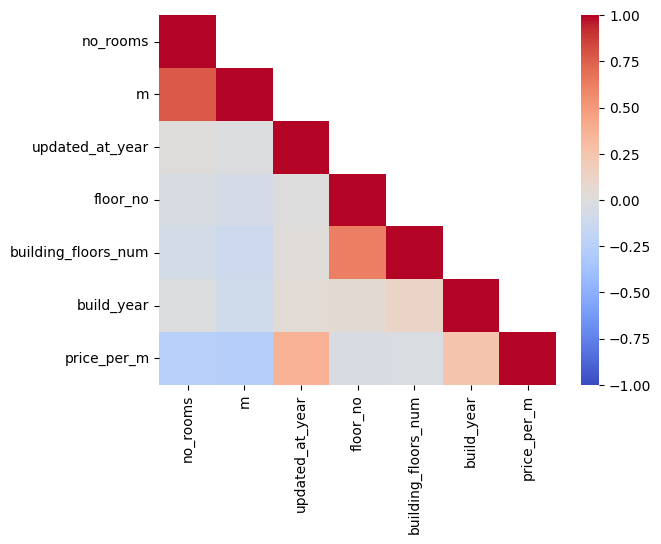

In [32]:
plt.figure(1)
corr = df_complete[plot_variables + ["price_per_m"]].corr()
mask = np.triu(np.ones_like(corr, dtype=bool),1)
sns.heatmap(corr, mask = mask, cmap = "coolwarm", vmin=-1, vmax=1)

We see a high correlation between _m_ and _no_rooms_. So we will keep just _m_.

We also can split the the categorical variables into:
- basic: limited number of classes
- extra: containing more complex data like enriched text or lists. These are suitable for NLP

In [33]:
num_variables =  ['m',
                'updated_at_year',
                'floor_no',
                'building_floors_num',
                'build_year'
                ]

cat_variables_basic = ['district',
                    'building_type',
                    'building_material',
                    'windows_type',
                    'heating',
                    'construction_status',
                    'building_ownership'
                    ]

cat_variables_extra = ['title',
                    'description',
                    'media_types',
                    'security_types',
                    'equipment_types',
                    'extras_types'
                    ]


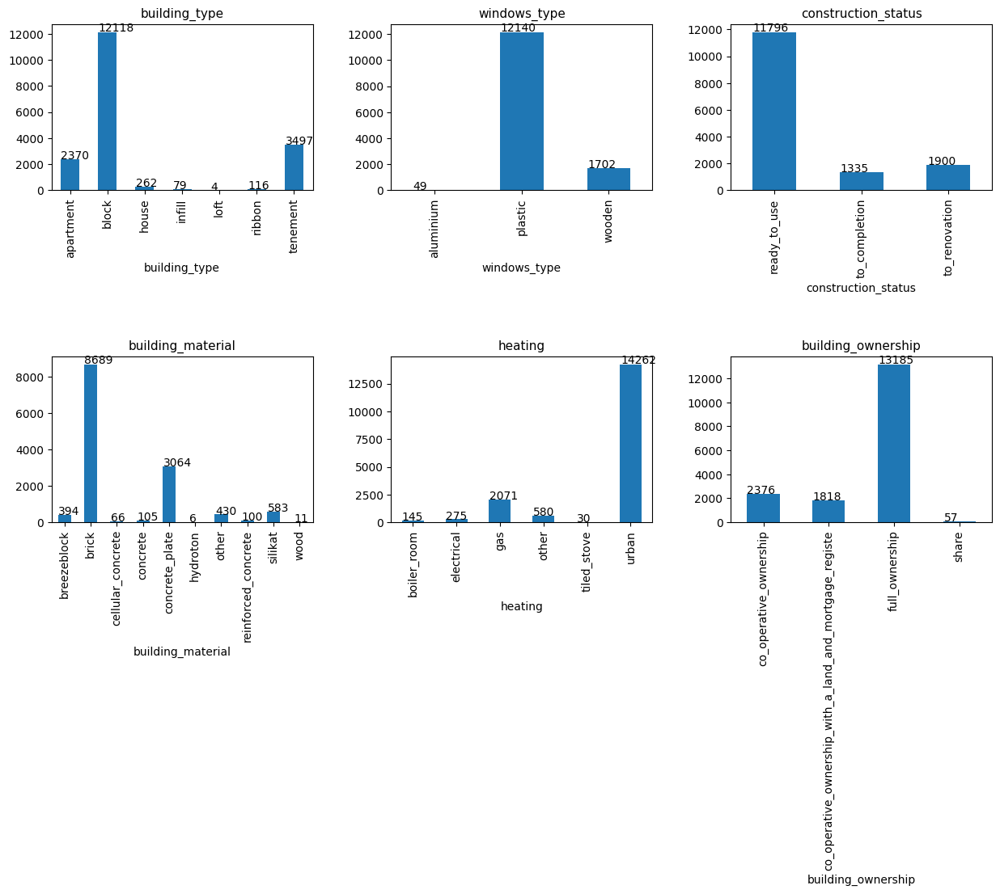

In [34]:
nr_rows = 2
nr_cols = 3

fig, axs = plt.subplots(nr_rows, nr_cols, figsize=(nr_cols*5,nr_rows*4))

for i, var in enumerate(cat_variables_basic[1:]):
    
    df_plot = df_complete.groupby(var)['title'].count().reset_index()
    df_plot.rename(columns={'title': 'count'}, inplace=True)
    df_plot.plot(kind='bar', x=var, y='count', legend=False, ax = axs[i%2][i//2])
    axs[i%2][i//2].set_title(var,fontsize=11)

    for p in axs[i%2][i//2].patches:
        axs[i%2][i//2].annotate(str(int(p.get_height())), (p.get_x() * 1.005, p.get_height() * 1.005))

plt.subplots_adjust(wspace=0.3, hspace=1)
plt.show()

Reviewing the basic categorical variables we spot some very small groups, we will try to group them into bigger groups as much as possible:

In [35]:
df_complete.loc[df_complete.building_type.isin(["loft", "ribbon", "infill"]), "building_type"] = "other"
df_complete.loc[df_complete.building_material.isin(["wood", "hydroton"]), "building_material"] = "other"
df_complete.loc[df_complete.building_material.isin(["reinforced_concrete", "concrete_plate", "cellular_concrete"]), "building_material"] = "concrete"
df_complete.loc[df_complete.heating.isin(["tiled_stove"]), "heating"] = "other"

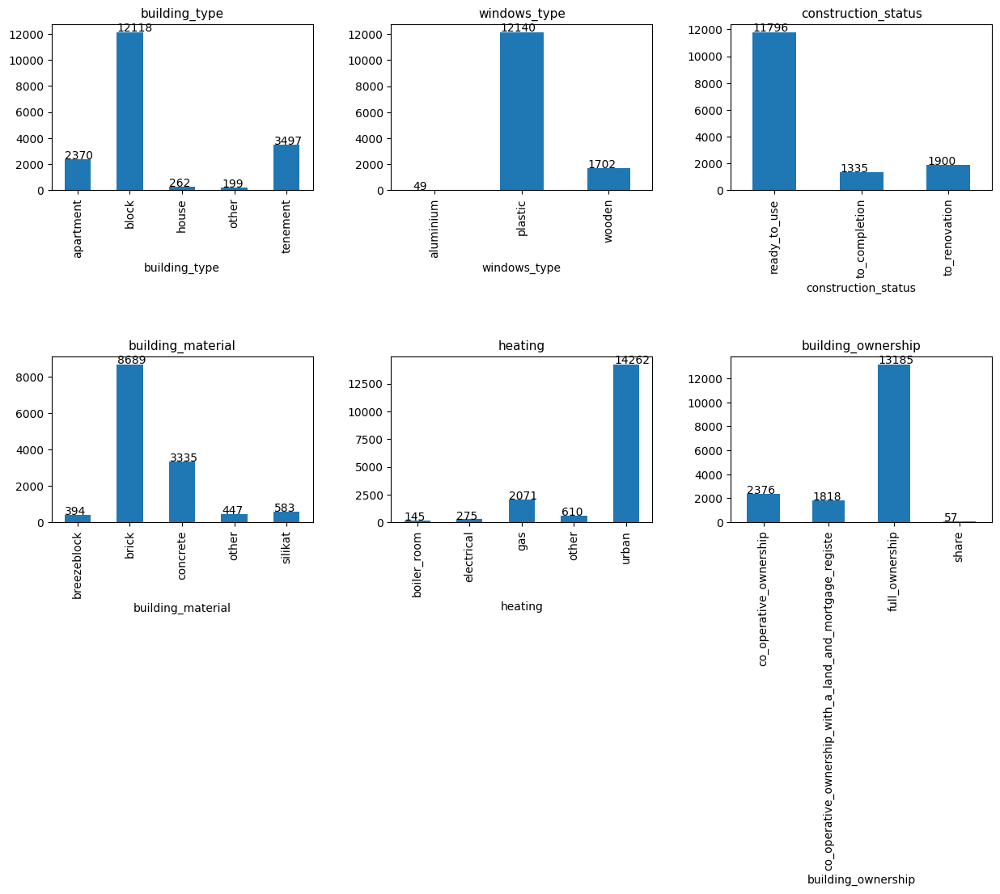

In [36]:
nr_rows = 2
nr_cols = 3

fig, axs = plt.subplots(nr_rows, nr_cols, figsize=(nr_cols*5,nr_rows*4))

for i, var in enumerate(cat_variables_basic[1:]):
    
    df_plot = df_complete.groupby(var)['title'].count().reset_index()
    df_plot.rename(columns={'title': 'count'}, inplace=True)
    df_plot.plot(kind='bar', x=var, y='count', legend=False, ax = axs[i%2][i//2])
    axs[i%2][i//2].set_title(var,fontsize=11)

    for p in axs[i%2][i//2].patches:
        axs[i%2][i//2].annotate(str(int(p.get_height())), (p.get_x() * 1.005, p.get_height() * 1.005))

plt.subplots_adjust(wspace=0.3, hspace=1)
plt.show()

## Modeling

In [41]:
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler, PolynomialFeatures
from sklearn.compose import ColumnTransformer

from sklearn.model_selection import cross_val_predict, cross_val_score, cross_validate

from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

RDN_SEED = 42

### Basic Models

In [38]:
from sklearn.linear_model import LinearRegression, Lasso
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor

In [42]:
X = df_complete[num_variables + cat_variables_basic].fillna("no_info")
y = df_complete["price_per_m"]

X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    train_size = 0.8,
                                                    random_state = RDN_SEED)

In [49]:
# Preprocessing Pipeline
num_pipeline = Pipeline([
    ("standar_scaler" , StandardScaler())
])

cat_pipeline = Pipeline([
    ("1hot", OneHotEncoder())
])

preprocessor = ColumnTransformer([
    ("num", num_pipeline, num_variables),
    ("cat", cat_pipeline, cat_variables_basic)
])

# Dictionary of Models
models = {
    'Linear Regression': LinearRegression(),
    'Lasso Regression': Lasso(alpha=0.1),
    'Random Forest': RandomForestRegressor(n_estimators=50, max_depth=10, random_state=RDN_SEED),
    'XGBoost': XGBRegressor(n_estimators=100, random_state=RDN_SEED)
}

scores = []

# Iterate through models and run the pipeline
for name, model in models.items():
    pipeline = Pipeline([
        ("preprocessor", preprocessor),
        (name, model)
    ])
    
    print(name)
    # Cross validation
    y_train_predicted = cross_val_predict(pipeline, X_train, y_train, cv =  5 )

    scores.append({
        "MAE": mean_absolute_error(y_train, y_train_predicted),
        "MSE": mean_squared_error(y_train, y_train_predicted),
        "r2": r2_score(y_train, y_train_predicted),
        "type": "cross_val",
        "model": name
        })
    
    # Training data
    pipeline.fit(X_train, y_train)
    y_train_predicted = pipeline.predict(X_train)

    scores.append({
        "MAE": mean_absolute_error(y_train, y_train_predicted),
        "MSE": mean_squared_error(y_train, y_train_predicted),
        "r2": r2_score(y_train, y_train_predicted),
        "type": "train",
        "model": name
        })
    
    # Test data
    y_test_predicted = pipeline.predict(X_test)

    scores.append({
        "MAE": mean_absolute_error(y_test, y_test_predicted),
        "MSE": mean_squared_error(y_test, y_test_predicted),
        "r2": r2_score(y_test, y_test_predicted),
        "type": "test",
        "model": name
        })
    
df_results = pd.DataFrame(scores)

Linear Regression
Lasso Regression
Random Forest
XGBoost


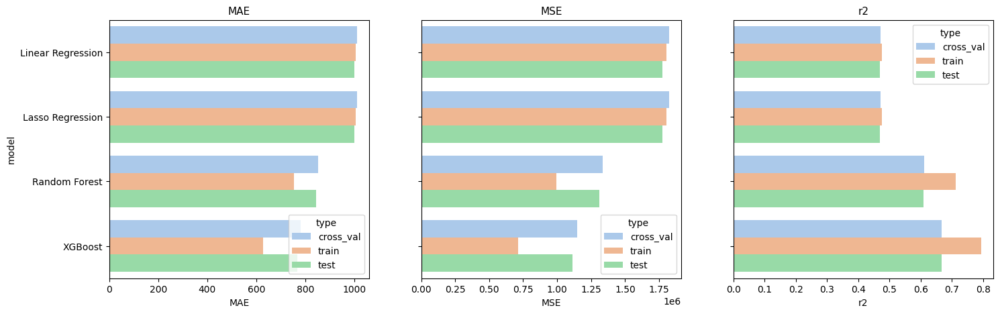

In [79]:
fig, axs = plt.subplots(1, 3, figsize=(17,5))

sns.barplot(data = df_results, x = "MAE", y = "model", hue = "type", ax = axs[0], palette = "pastel")
axs[0].set_title("MAE",fontsize=11)

sns.barplot(data = df_results, x = "MSE", y = "model", hue = "type", ax = axs[1], palette = "pastel")
axs[1].set_title("MSE",fontsize=11)
axs[1].set_ylabel("")
axs[1].set_yticklabels([])

sns.barplot(data = df_results, x = "r2", y = "model", hue = "type", ax = axs[2], palette = "pastel")
axs[2].set_title("r2",fontsize=11)
axs[2].set_ylabel("")
axs[2].set_yticklabels([])

plt.show()

Text(0.5, 1.0, 'XGBRegressor Feature Importance')

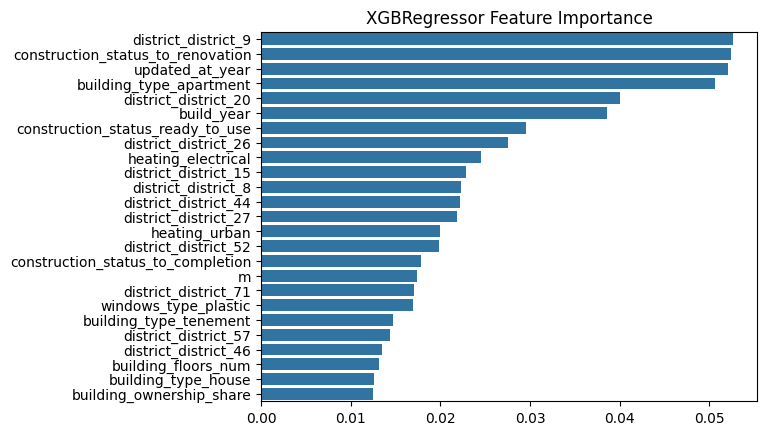

In [83]:
xgb_model = pipeline.named_steps['XGBoost']

feature_importance_XGBoost = xgb_model.feature_importances_

# Getting Variables names after the Preprocessing
cat_variables_after = preprocessor.named_transformers_['cat'].get_feature_names_out(cat_variables_basic)

# Combine the feature names
feature_names = np.concatenate([num_variables, cat_variables_after])

# Sort the feature importances and corresponding feature names
sorted_indices = np.argsort(feature_importance_XGBoost)[::-1]  # Sort in descending order
sorted_feature_importance = feature_importance_XGBoost[sorted_indices]
sorted_feature_names = feature_names[sorted_indices]

sns.barplot(x = sorted_feature_importance[:25], y = sorted_feature_names[:25])
plt.title("XGBRegressor Feature Importance")

Text(0.5, 1.0, 'Test data. Price_per_m vs m')

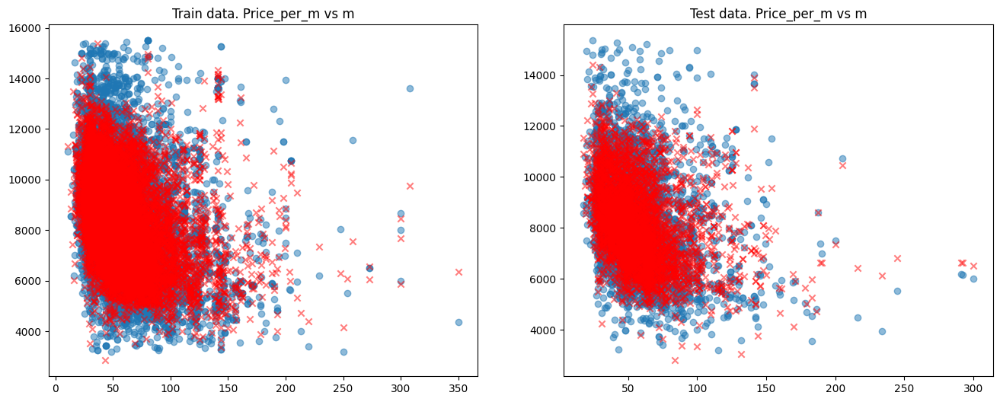

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(16,6))

axs[0].scatter(y = y_train, x = X_train["m"], alpha =  0.5)
axs[0].scatter(y = y_train_predicted , x = X_train["m"], c = "red", alpha =  0.5, marker= "x")
axs[0].set_title("Train data. Price_per_m vs m")

axs[1].scatter(y = y_test, x = X_test["m"], alpha =  0.5)
axs[1].scatter(y = y_test_pred , x = X_test["m"], c = "red", alpha =  0.5, marker= "x")
axs[1].set_title("Test data. Price_per_m vs m")

### NLP for extra variables

In [3]:
import spacy
from transformers import XLMRobertaTokenizer, TFXLMRobertaModel
import sentencepiece
import tensorflow as tf
from IPython.display import clear_output


2024-08-12 01:05:19.554657: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2024-08-12 01:05:19.839345: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2024-08-12 01:05:19.843293: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-08-12 01:05:21.066021: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [146]:
df_complete.reset_index(drop = True)
df_complete.fillna("", inplace = True)

# Load Spacy's NER model
nlp = spacy.load('pl_core_news_sm')

def extract_places(text, idx=None):
    clear_output(wait=True)

    if idx is not None and idx % 100 == 0:  # Adjust the modulus for how often you want to print
        print(f"Processing row {idx}")

    clean_text = text.replace("<br/>", "").replace("</p>", "").replace("<p>", "")    
    doc = nlp(clean_text)
    
    return ", ".join([ent.text for ent in doc.ents if ent.label_ in ['geogName', "placeName"]])

# Apply the function with an index tracker
df_complete['NER_places'] = df_complete['description'].apply(lambda x: extract_places(x, df_complete.index[df_complete['description'] == x][0]))

# Remove square brackets from the relevant columns
df_complete['media_types'] = df_complete['media_types'].str.replace('[\[\]]', '', regex=True)
df_complete['security_types'] = df_complete['security_types'].str.replace('[\[\]]', '', regex=True)
df_complete['equipment_types'] = df_complete['equipment_types'].str.replace('[\[\]]', '', regex=True)
df_complete['extras_types'] = df_complete['extras_types'].str.replace('[\[\]]', '', regex=True)

# Concatenate columns to form the final string
df_complete['final_str'] = df_complete['title'] + ". " + df_complete['NER_places']+ ". " + df_complete['media_types']+ ". " + df_complete['security_types']+ ". " + df_complete['equipment_types']+ ". " + df_complete['extras_types']

Processing row 39200


In [159]:
df_complete[num_variables + cat_variables_basic + ["final_str", "price_per_m"]].to_csv("data/data_prepared.csv", index = False)

In [4]:
df_complete = pd.read_csv("data/data_prepared.csv")

In [6]:
# Load the XLM-RoBERTa model and tokenizer using TensorFlow
tokenizer = XLMRobertaTokenizer.from_pretrained('xlm-roberta-base')
model = TFXLMRobertaModel.from_pretrained('xlm-roberta-base')

# Function to create embeddings using TensorFlow and XLM-RoBERTa
def create_embedding(text,idx = None):
    clear_output(wait=True)

    if idx is not None and idx % 100 == 0:  # Adjust the modulus for how often you want to print
        print(f"Processing row {idx}")

    inputs = tokenizer(text, return_tensors="tf", padding=True, truncation=True)
    outputs = model(inputs)
    return tf.reduce_mean(outputs.last_hidden_state, axis=1).numpy().squeeze()  # Get the mean pooling of the last hidden state

# Apply the embedding function to the final_str column
df_complete['embedding'] = df_complete['final_str'].apply(lambda x: create_embedding(x, df_complete.index[df_complete['final_str'] == x][0]))

KeyboardInterrupt: 

In [ ]:
df_final = df_complete[num_variables + cat_variables_basic + ["embedding", "price_per_m"]]
df_final.to_csv("data/data_embeddings.csv", index = False)

### Neural Network

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Concatenate, Dropout
from tensorflow.keras.optimizers import Adam
import numpy as np

# Numerical variables (5 features)
numerical_data = X_train

# Sparse vector (10 features, each with 80 dimensions)
sparse_vector_data = np.random.random((num_samples, 10, 80))

# Embeddings (10 features, each with 768 dimensions)
embedding_data = np.random.random((num_samples, 10, 768))

# Target values for regression
target = np.random.random(num_samples)

# Define the model
# Numerical input
numerical_input = Input(shape=(5,), name='numerical_input')

# Sparse vector input
sparse_input = Input(shape=(80, ), name='sparse_input')
sparse_flattened = tf.keras.layers.Flatten()(sparse_input)
sparse_dense = Dense(10, activation='relu')(sparse_flattened)

# Embedding input
embedding_input = Input(shape=(768, ), name='embedding_input')
embedding_flattened = tf.keras.layers.Flatten()(embedding_input)
embedding_dense = Dense(10, activation='relu')(embedding_flattened)

# Concatenate all features
concatenated = Concatenate()([numerical_input, sparse_dense, embedding_dense])

# Add dense layers
x = Dense(128, activation='relu')(concatenated)
x = Dropout(0.5)(x)
x = Dense(64, activation='relu')(x)
x = Dropout(0.5)(x)

# Output layer for regression
output = Dense(1)(x)

# Create the model
model = Model(inputs=[numerical_input, sparse_input, embedding_input], outputs=output)

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Summary of the model
model.summary()

# Train the model
model.fit(
    [numerical_data, sparse_vector_data, embedding_data],
    target,
    epochs=10,
    batch_size=32,
    validation_split=0.2
)